# Model ML

## Libraries

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np
import json
import copy
import folium
import branca
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster

## Procesar datos

In [29]:
# -------------------- Experanza de vida --------------------
le = pd.read_csv("data/life_expectancy.csv")
le_agg = (
    le.groupby("Neighborhood")[["2010-2014"]]
    .mean()
    .reset_index()
    .rename(columns={"2010-2014": "life_expectancy"})
)

# -------------------- Poblacion --------------------
pop = pd.read_csv("data/population.csv")
pop_tot = (
    pop[pop["Year"] == 2017].groupby("Neighborhood.Name")["Number"].sum().reset_index()
)
pop_tot.rename(
    columns={"Neighborhood.Name": "Neighborhood", "Number": "population"}, inplace=True
)

# -------------------- Desempleo --------------------
unemp = pd.read_csv("data/unemployment.csv")
unemp_reg = (
    unemp[unemp["Demand_occupation"] == "Registered unemployed"]
    .groupby(["Neighborhood Name", "Month"])["Number"]
    .sum()
    .reset_index()
)
unemp_avg = unemp_reg.groupby("Neighborhood Name")["Number"].mean().reset_index()
unemp_avg.rename(
    columns={"Neighborhood Name": "Neighborhood", "Number": "unemployed_avg"},
    inplace=True,
)

# -------------------- Accidentes --------------------
acc = pd.read_csv("data/accidents_2017.csv")
acc_count = (
    acc[acc["Neighborhood Name"] != "Unknown"]
    .groupby("Neighborhood Name")["Id"]
    .count()
    .reset_index()
)
acc_count.rename(
    columns={"Neighborhood Name": "Neighborhood", "Id": "accidents_count"}, inplace=True
)

# -------------------- Bus + centroides de barrio --------------------
bus = pd.read_csv("data/bus_stops.csv")
bus_nb = (
    bus.groupby("Neighborhood.Name")
    .agg({"Bus.Stop": "count", "Latitude": "mean", "Longitude": "mean"})
    .reset_index()
    .rename(columns={"Neighborhood.Name": "Neighborhood", "Bus.Stop": "stops_count"})
)

# -------------------- Calidad del aire y estaciones --------------------
aq = pd.read_csv("data/air_quality_Nov2017.csv")
stas = pd.read_csv("data/air_stations_Nov2017.csv")
# Limpiar y promediar NO2 por estación
aq_valid = aq[pd.to_numeric(aq["NO2 Value"], errors="coerce").notnull()].copy()
aq_valid["NO2 Value"] = aq_valid["NO2 Value"].astype(float)
station_no2 = (
    aq_valid.groupby("Station")["NO2 Value"]
    .mean()
    .reset_index()
    .rename(columns={"NO2 Value": "no2_station"})
)
# Coordenadas de cada estación
station_df = pd.merge(
    station_no2, stas[["Station", "Latitude", "Longitude"]], on="Station"
)
# NO2 existente por barrio
aq2 = pd.merge(aq_valid, stas[["Station", "Neighborhood Name"]], on="Station")
no2_nb = (
    aq2.groupby("Neighborhood Name")["NO2 Value"]
    .mean()
    .reset_index()
    .rename(columns={"Neighborhood Name": "Neighborhood", "NO2 Value": "no2_avg"})
)
# Combinar
df_nb = pd.merge(
    bus_nb[["Neighborhood", "Latitude", "Longitude", "stops_count"]],
    no2_nb,
    on="Neighborhood",
    how="left",
)
# Imputar barrios sin sensor
coords_st = station_df[["Latitude", "Longitude"]].values
no2_vals = station_df["no2_station"].values

def impute_no2(row):
    if pd.notnull(row["no2_avg"]):
        return row["no2_avg"]
    # Euclidian distance
    dists = np.sqrt(
        ((coords_st - np.array([row["Latitude"], row["Longitude"]])) ** 2).sum(axis=1)
    )
    return no2_vals[dists.argmin()]

df_nb["no2_filled"] = df_nb.apply(impute_no2, axis=1)

# Unión con NO2 imputado en pipeline principal
df = (
    le_agg.merge(pop_tot, on="Neighborhood")
    .merge(unemp_avg, on="Neighborhood", how="left")
    .merge(acc_count, on="Neighborhood", how="left")
    .merge(
        df_nb[["Neighborhood", "stops_count", "Latitude", "Longitude", "no2_filled"]],
        on="Neighborhood",
        how="left",
    )
    .merge(
        pd.read_csv("data/transports.csv")
        .query("Transport in ['Underground','Railway (FGC)']")
        .groupby("Neighborhood.Name")["Station"]
        .count()
        .reset_index()
        .rename(columns={"Neighborhood.Name": "Neighborhood", "Station": "rail_count"}),
        on="Neighborhood",
        how="left",
    )
)
# Renombrar no2_filled->no2_avg
df.rename(columns={"no2_filled": "no2_avg"}, inplace=True)

# -------------------- Cálculo de tasas e indicadores --------------------
df["acc_rate"] = df["accidents_count"] / df["population"] * 1000
df["stops_rate"] = df["stops_count"] / df["population"] * 1000
df["unemp_rate"] = df["unemployed_avg"] / df["population"] * 100
df["rail_rate"] = df["rail_count"] / df["population"] * 1000

# -------------------- Guardar dataframe --------------------
df.to_csv("data/df_final.csv", index=False)

## Train model

In [30]:
# Preparar X, y
features = ["acc_rate", "stops_rate", "no2_avg", "rail_rate", "unemp_rate"]
df_clean = df.dropna(subset=features + ["life_expectancy", "Latitude", "Longitude"]).reset_index(drop=True)
X = df_clean[features].values
y = df_clean["life_expectancy"].values

# Dividir train / validation (80% / 20%)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Definir modelos
models = {
    "Random Forest": RandomForestRegressor(n_estimators=200, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=200, learning_rate=0.05, random_state=42),
    "Ridge Regression": Ridge(alpha=1.0)
}

# Entrenar y evaluar cada modelo
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    mse = mean_squared_error(y_val, y_pred)
    r2  = r2_score(y_val, y_pred)
    results.append({"Model": name, "R2 Score": r2, "MSE": mse})

# Mostrar resultados
results_df = pd.DataFrame(results).set_index("Model")
print(results_df)

                   R2 Score       MSE
Model                                
Random Forest      0.634591  0.725693
Gradient Boosting  0.636720  0.721464
Ridge Regression   0.438335  1.115451


## Importancia de variables

In [31]:
# Para cada modelo de árbol:
for name in ['Random Forest', 'Gradient Boosting']:
    model = models[name]
    importances = model.feature_importances_
    feat_imp = pd.DataFrame({
        'feature': features,
        'importance': importances
    }).sort_values('importance', ascending=False)
    print(f"=== {name} ===")
    print(feat_imp)
    print()

=== Random Forest ===
      feature  importance
4  unemp_rate    0.357050
1  stops_rate    0.294965
3   rail_rate    0.184716
0    acc_rate    0.111318
2     no2_avg    0.051950

=== Gradient Boosting ===
      feature  importance
4  unemp_rate    0.359197
3   rail_rate    0.236613
1  stops_rate    0.227995
0    acc_rate    0.122857
2     no2_avg    0.053338



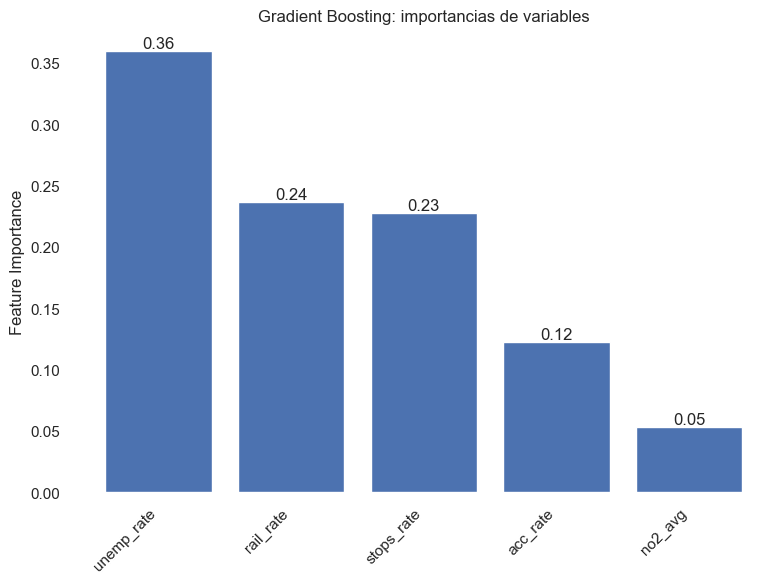

In [49]:
def plot_feature_importances(features, importances, 
                             figsize=(8,6), 
                             title="Feature Importances",
                             ylabel="Importance",
                             save_path=None, 
                             transparent=False):
    # Ordenar de mayor a menor
    idx = np.argsort(importances)[::-1]
    feats = np.array(features)[idx]
    imps = np.array(importances)[idx]
    
    # Crear figura y barras
    fig, ax = plt.subplots(figsize=figsize)
    bars = ax.bar(feats, imps)
    
    # Quitar todos los spines
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Anotar el valor encima de cada barra
    for bar, val in zip(bars, imps):
        ax.text(
            bar.get_x() + bar.get_width()/2,
            val,                       
            f"{val:.2f}",                     
            ha="center", va="bottom", 
            fontsize=12
        )
    
    # Ajustes
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    
    # Guardar si se pide
    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)
    
    return fig, ax


fig_feature_importances, ax_feature_importances = plot_feature_importances(
    features, 
    importances=models['Gradient Boosting'].feature_importances_, 
    title="Gradient Boosting: importancias de variables",
    ylabel="Feature Importance"
)

## Model

In [33]:
# Extrae y entrena Gradient Boosting
gb = models["Gradient Boosting"]
gb.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.05, n_estimators=200, random_state=42)

## Escenarios

In [34]:
scenarios = {
    "Conservador": {
        "acc_rate": 0.90,
        "stops_rate": 1.00,
        "no2_avg": 0.98,
        "rail_rate": 1.00,
        "unemp_rate": 1.00,
    },
    "Neutral": {
        "acc_rate": 0.90,
        "stops_rate": 1.10,
        "no2_avg": 0.90,
        "rail_rate": 1.05,
        "unemp_rate": 0.98,
    },
    "Optimista": {
        "acc_rate": 0.80,
        "stops_rate": 1.20,
        "no2_avg": 0.80,
        "rail_rate": 1.10,
        "unemp_rate": 0.95,
    },
    "Crisis Económica": {
        "acc_rate": 1.10,
        "stops_rate": 0.90,
        "no2_avg": 1.10,
        "rail_rate": 0.95,
        "unemp_rate": 1.10,
    },
    "Transición Verde": {
        "acc_rate": 0.85,
        "stops_rate": 1.15,
        "no2_avg": 0.70,
        "rail_rate": 1.20,
        "unemp_rate": 0.97,
    },
    "Innovación Tecnológica": {
        "acc_rate": 0.90,
        "stops_rate": 1.20,
        "no2_avg": 0.85,
        "rail_rate": 1.30,
        "unemp_rate": 0.95,
    },
    "Equidad Social": {
        "acc_rate": 0.80,
        "stops_rate": 1.25,
        "no2_avg": 0.90,
        "rail_rate": 1.10,
        "unemp_rate": 0.90,
    },
}
for name, fac in scenarios.items():
    arr = np.array([fac[f] for f in features])
    df_clean[f"diff_{name}"] = (
        gb.predict(df_clean[features].values * arr) - df_clean["life_expectancy"]
    )

## Mapa de predicción de escenarios

In [35]:
# Carga del GeoJSON
geojson_path = 'data/barris.geojson'
with open(geojson_path, 'r', encoding='utf-8') as f:
    barrios_geo = json.load(f)

# Mapa base
m = folium.Map(location=[41.3851, 2.1734], zoom_start=12, tiles='CartoDB positron')

# Colormap global
vmin = df_clean[[f'diff_{s}' for s in scenarios]].min().min()
vmax = df_clean[[f'diff_{s}' for s in scenarios]].max().max()
colormap = branca.colormap.linear.RdYlGn_11.scale(vmin, vmax)
colormap.caption = 'Cambio en esperanza de vida (años)'

# Superponer por escenario con tooltip de nombre y valor
for scen in scenarios:
    diff_dict = df_clean.set_index('Neighborhood')[f'diff_{scen}'].round(2).to_dict()
    fg = folium.FeatureGroup(name=scen, show=(scen=='Neutral'))
    # Hacer copia profunda y añadir el valor en properties
    geo_copy = copy.deepcopy(barrios_geo)
    for feat in geo_copy['features']:
        barrio = feat['properties']['NOM']
        feat['properties']['value'] = diff_dict.get(barrio, 'N/A')
    # Tooltip con dos campos
    tooltip = folium.GeoJsonTooltip(
        fields=['NOM','value'],
        aliases=['Barrio:','Cambio (años):'],
        localize=True
    )
    # Añadir GeoJson
    folium.GeoJson(
        geo_copy,
        style_function=lambda feature, d=diff_dict: {
            'fillColor': colormap(d.get(feature['properties']['NOM'], 0)),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7
        },
        tooltip=tooltip
    ).add_to(fg)
    fg.add_to(m)

# Leyenda y control de capas
colormap.add_to(m)
folium.LayerControl(collapsed=False).add_to(m)

# Mostrar mapa
m


## Gráficos

### Colores para escenarios

In [64]:
escenarios = [
    'Conservador',
    'Neutral',
    'Optimista',
    'Crisis Económica',
    'Transición Verde',
    'Innovación Tecnológica',
    'Equidad Social'
]

In [36]:
scenario_colors = {
    'Conservador':            '#4E79A7',  # azul
    'Neutral':                '#F28E2B',  # naranja
    'Optimista':               '#76B7B2',  # verde
    'Crisis Económica':       '#E15759',  # rojo
    'Transición Verde':       '#59A14F',  # verde
    'Innovación Tecnológica': '#EDC948',  # amarillo
    'Equidad Social':         '#B07AA1'   # morado
}

### Heatmap

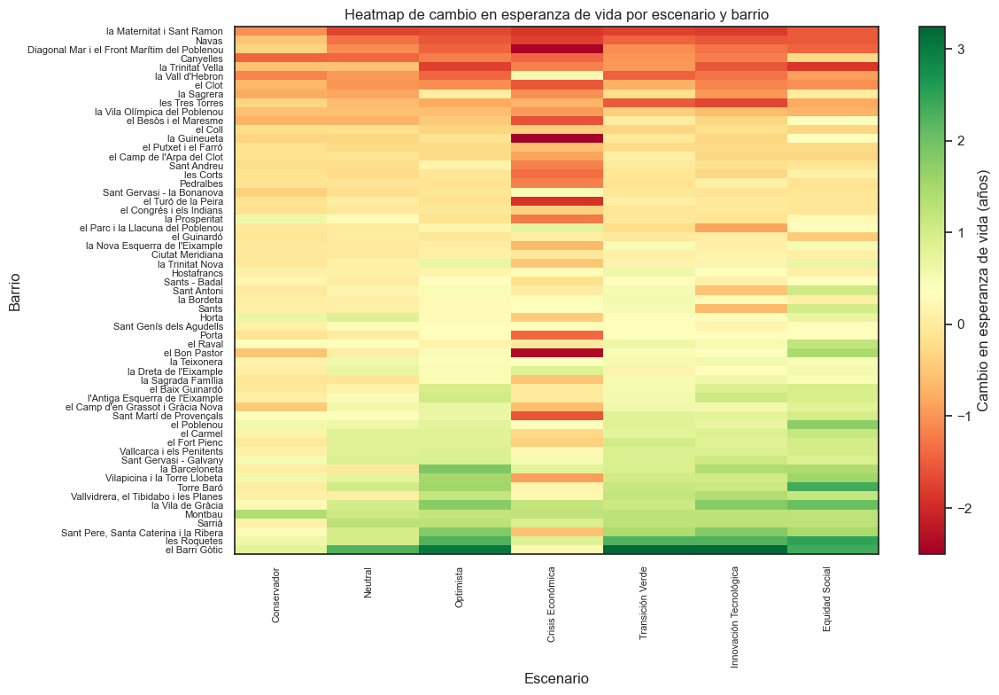

In [54]:
def plot_diff_heatmap(df, scenarios, 
                      neighborhood_col='Neighborhood',
                      save_path=None, transparent=False,
                      figsize=(12, 8), cmap='RdYlGn'):

    # Extraer los valores diff y ordenarlos por la mediana
    diff_cols = [f"diff_{s}" for s in scenarios]
    data = df[diff_cols].values
    medianas = np.median(data, axis=1)
    order = np.argsort(medianas)
    data_sorted = data[order, :]
    barrios_sorted = df[neighborhood_col].values[order]

    # Crear figura y ejes
    fig, ax = plt.subplots(figsize=figsize)
    
    # Dibujar el heatmap
    im = ax.imshow(
        data_sorted,
        aspect='auto',
        cmap=cmap,
        vmin=data.min(),
        vmax=data.max()
    )
    cbar = fig.colorbar(im, ax=ax, label='Cambio en esperanza de vida (años)')

    # Configurar etiquetas de ejes
    ax.set_xticks(np.arange(len(scenarios)))
    ax.set_xticklabels(scenarios, rotation=90, ha='right', fontsize=8)
    ax.set_yticks(np.arange(len(barrios_sorted)))
    ax.set_yticklabels(barrios_sorted, fontsize=8)

    # Títulos y labels
    ax.set_title('Heatmap de cambio en esperanza de vida por escenario y barrio')
    ax.set_xlabel('Escenario')
    ax.set_ylabel('Barrio')

    plt.tight_layout()

    # Guardar la figura si se pide
    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)

    return fig, ax

fig_heatmap, ax_heatmap = plot_diff_heatmap(df_clean, scenarios)

### Clustermap

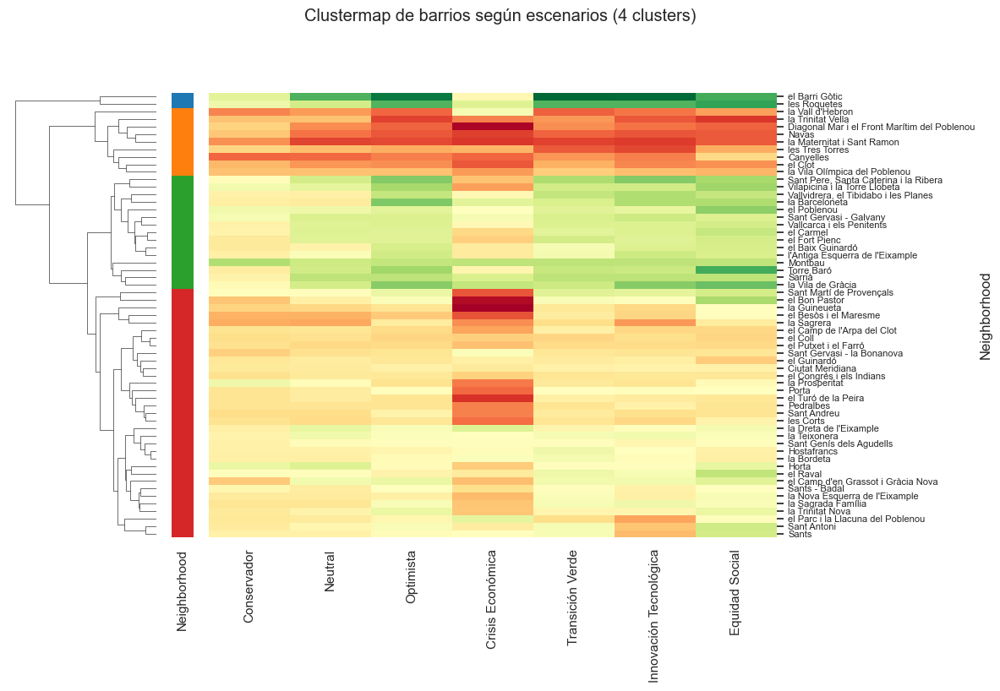

In [70]:
def plot_diff_clustermap(df, scenarios,
                         neighborhood_col='Neighborhood',
                         n_clusters=4,
                         figsize=(12, 8),
                         cmap='RdYlGn',
                         palette='tab10',
                         save_path=None,
                         transparent=False):

    # Construir DataFrame de diferencias
    diff_cols = [f"diff_{s}" for s in scenarios]
    df_diff = df.set_index(neighborhood_col)[diff_cols]
    df_diff.columns = scenarios

    # Cálculo de linkage jerárquico
    Z = linkage(df_diff.values, method='average', metric='euclidean')

    # Asignar clusters
    clusters = fcluster(Z, t=n_clusters, criterion='maxclust')
    # Mapear a colores
    pal = sns.color_palette(palette, n_clusters)
    row_colors = df_diff.index.to_series().map(lambda x: pal[clusters[df_diff.index.get_loc(x)] - 1])

    # Configurar estilo
    sns.set(context='notebook', style='white')
    
    # Dibujar clustermap
    g = sns.clustermap(
        df_diff,
        row_linkage=Z,
        col_cluster=False,
        row_colors=row_colors,
        cmap=cmap,
        figsize=figsize,
        yticklabels=True,
        xticklabels=True,
        dendrogram_ratio=(0.2, 0.02),
        cbar_pos=None
    )
    
    # Ajustar etiquetas de barrios
    plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=8)
    
    # Eliminar líneas del recuadro del heatmap
    for spine in g.ax_heatmap.spines.values():
        spine.set_visible(False)
    
    # Título
    plt.suptitle(f'Clustermap de barrios según escenarios ({n_clusters} clusters)', y=1.02)
    plt.tight_layout()

    # Guardar si se solicita
    if save_path:
        g.fig.savefig(save_path, transparent=transparent)

    return g.fig

fig_clustermap = plot_diff_clustermap(df_clean, scenarios, n_clusters=4)

### Boxplots por escenario

/var/folders/dh/_ks73kfn57l67vxm7b5y16qw0000gn/T/ipykernel_36962/490463148.py:18: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = ax.boxplot(


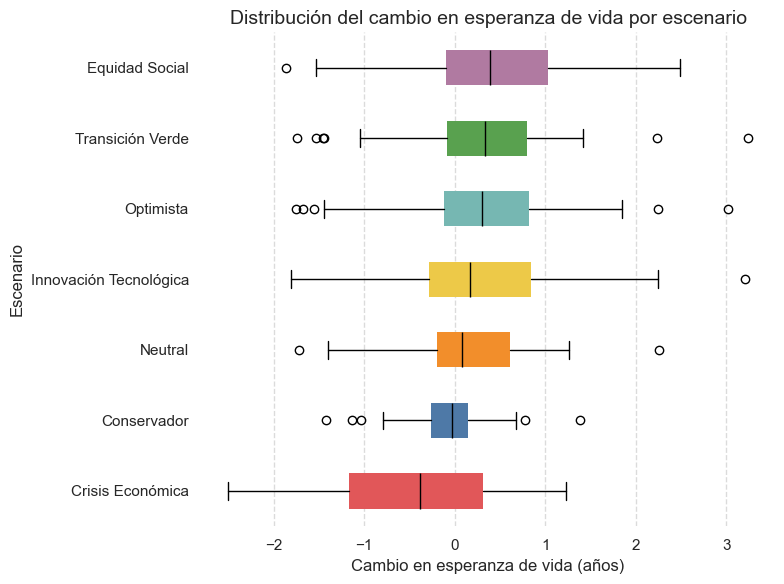

In [59]:
def plot_diff_by_scenario_boxplot(df, escenarios, scenario_colors,
                                  figsize=(8, 6),
                                  title='Distribución del cambio en esperanza de vida por escenario',
                                  xlabel='Cambio en esperanza de vida (años)',
                                  ylabel='Escenario',
                                  save_path=None,
                                  transparent=False):

    # Calcular mediana por escenario
    medianas = {esc: df[f'diff_{esc}'].median() for esc in escenarios}
    # Ordenar escenarios por mediana ascendente
    ordenados = sorted(escenarios, key=lambda esc: medianas[esc])
    # Preparar datos
    data = [df[f'diff_{esc}'] for esc in ordenados]
    
    # Crear figura y boxplot
    fig, ax = plt.subplots(figsize=figsize)
    bplot = ax.boxplot(
        data,
        labels=ordenados,
        vert=False,
        patch_artist=True,
        medianprops={'color': 'black'}
    )
    
    # Colorear cajas
    for patch, esc in zip(bplot['boxes'], ordenados):
        patch.set_facecolor(scenario_colors.get(esc, '#CCCCCC'))
        patch.set_edgecolor('none')
    
    # Quitar todos los spines
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Etiquetas y estilo
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_title(title, fontsize=14)
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    # Guardar si se pide
    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)
    
    return fig, ax

fig_scenario_boxplot, ax_scenario_boxplot = plot_diff_by_scenario_boxplot(df_clean, escenarios, scenario_colors)

### Cambio medio por escenario

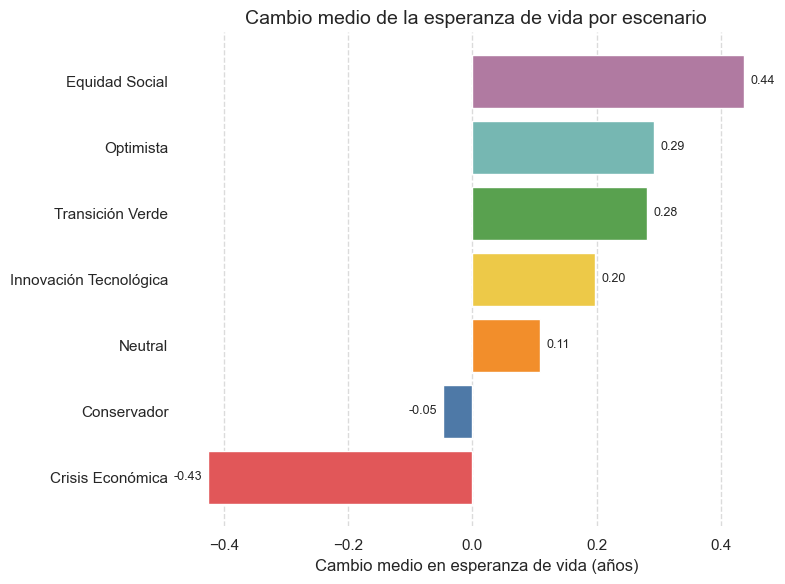

In [63]:
def plot_mean_diff_by_scenario(df, scenario_colors,
                               figsize=(8, 6),
                               title="Cambio medio de la esperanza de vida por escenario",
                               xlabel="Cambio medio en esperanza de vida (años)",
                               save_path=None,
                               transparent=False,
                               label_offset=0.01):

    # Extraer y renombrar diff_*
    diff_cols = [c for c in df.columns if c.startswith("diff_")]
    scenario_names = [c.replace("diff_", "") for c in diff_cols]
    df_diff = df[diff_cols].copy()
    df_diff.columns = scenario_names

    # Calcular medias y ordenar
    means = df_diff.mean().sort_values()
    ordenados = means.index.tolist()
    valores = means.values
    colors = [scenario_colors.get(esc, "#CCCCCC") for esc in ordenados]

    # Crear figura y barh
    fig, ax = plt.subplots(figsize=figsize)
    bars = ax.barh(ordenados, valores, color=colors)

    # Quitar todos los spines
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Anotar valor de cada barra
    for bar, val in zip(bars, valores):
        x = bar.get_width()
        # Si el valor es positivo, desplazamos a la derecha; si es negativo, a la izquierda
        ha = 'left' if val >= 0 else 'right'
        x_text = x + label_offset if val >= 0 else x - label_offset
        ax.text(
            x_text,
            bar.get_y() + bar.get_height()/2,
            f"{val:.2f}",
            va="center",
            ha=ha,
            fontsize=9
        )

    # Labels, título y grid
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_title(title, fontsize=14)
    ax.grid(axis="x", linestyle="--", alpha=0.7)
    plt.tight_layout()

    # Guardar si se solicita
    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)

    return fig, ax

fig_mean_diff, ax_mean_diff = plot_mean_diff_by_scenario(df_clean, scenario_colors)

### Actual vs Proyectado: Esperanza de Vida por Escenario

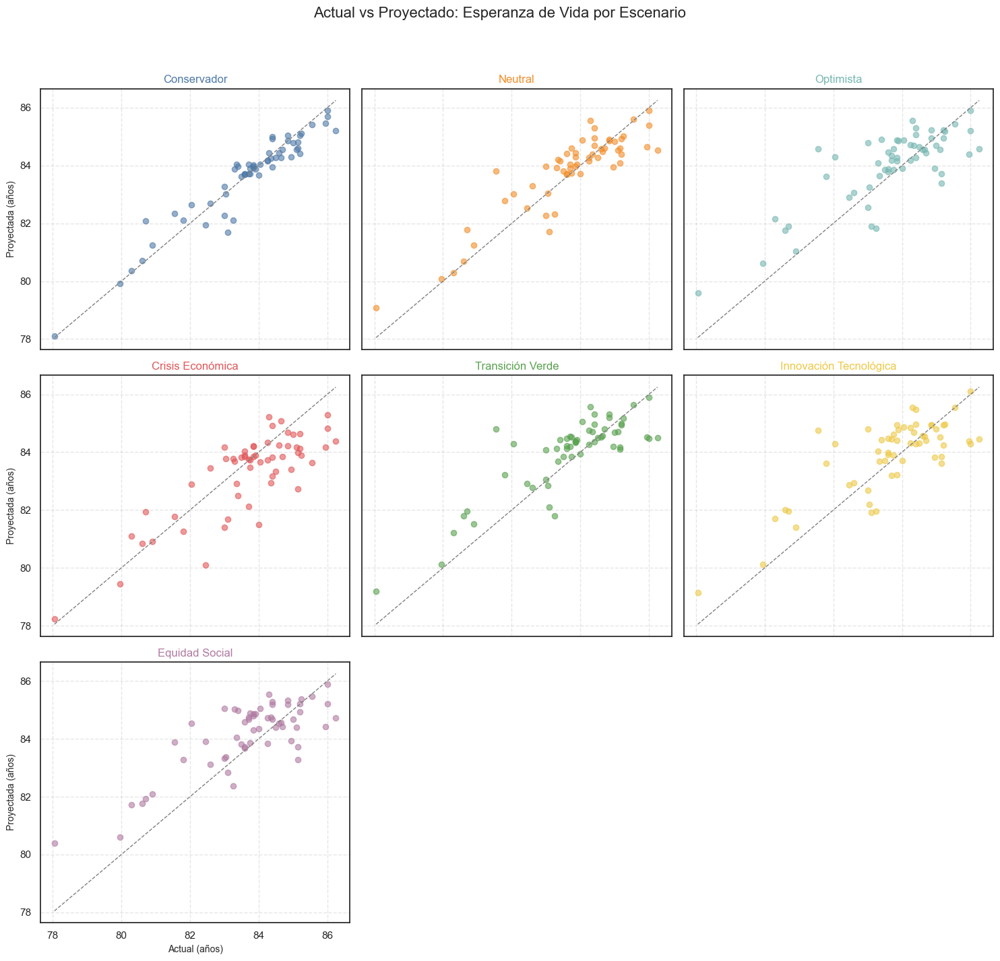

In [67]:
def plot_actual_vs_projected(df, escenarios, scenario_colors,
                             neighborhood_col="life_expectancy",
                             cols=3,
                             figsize_per_plot=(5, 5),
                             suptitle="Actual vs Proyectado: Esperanza de Vida por Escenario",
                             save_path=None,
                             transparent=False):

    y_true = df[neighborhood_col].values
    n = len(escenarios)
    rows = int(np.ceil(n / cols))
    figsize = (cols * figsize_per_plot[0], rows * figsize_per_plot[1])

    fig, axes = plt.subplots(rows, cols, figsize=figsize, sharex=True, sharey=True)
    axes = axes.flatten()

    # Rango común para la línea de identidad
    vmin, vmax = y_true.min(), y_true.max()

    for i, esc in enumerate(escenarios):
        ax = axes[i]
        y_pred = y_true + df[f"diff_{esc}"].values
        c = scenario_colors.get(esc, "#000000")

        ax.scatter(y_true, y_pred, alpha=0.6, color=c)
        ax.plot([vmin, vmax], [vmin, vmax], "--", color="gray", lw=1)

        ax.set_title(esc, color=c, fontsize=12)
        if i % cols == 0:
            ax.set_ylabel("Proyectada (años)", fontsize=10)
        if i // cols == rows - 1:
            ax.set_xlabel("Actual (años)", fontsize=10)
        ax.grid(True, linestyle="--", alpha=0.5)

    # Eliminar ejes sobrantes
    for j in range(n, rows * cols):
        fig.delaxes(axes[j])

    fig.suptitle(suptitle, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)

    return fig, axes

fig_actual_vs_projected, axes_actual_vs_projected = plot_actual_vs_projected(df_clean, escenarios, scenario_colors)

### Radar: Media de cambio de esperanza de vida por escenario

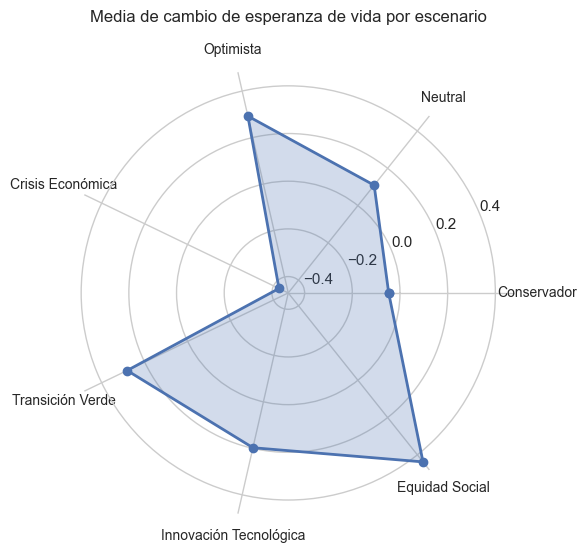

In [ ]:
def plot_radar_mean_diff(df, 
                         diff_prefix="diff_",
                         color=None,
                         fill_alpha=0.25,
                         figsize=(6, 6),
                         title="Radar: Media de cambio de esperanza de vida por escenario",
                         save_path=None,
                         transparent=False):

    # Extraer escenarios y medias
    diff_cols = [c for c in df.columns if c.startswith(diff_prefix)]
    escenarios = [c[len(diff_prefix):] for c in diff_cols]
    medias = [df[c].mean() for c in diff_cols]
    
    # Preparar ángulos y cerrar el polígono
    N = len(escenarios)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    medias = medias + medias[:1]
    angles = angles + angles[:1]
    
    # Crear figura polar
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(polar=True))
    
    # Color por defecto
    if color is None:
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        line_color = default_colors[0]
    else:
        line_color = color
    
    # Dibujar línea y relleno
    ax.plot(angles, medias, 'o-', linewidth=2, color=line_color)
    ax.fill(angles, medias, alpha=fill_alpha, color=line_color)
    
    # Etiquetas de los ejes theta
    ax.set_thetagrids(np.degrees(angles[:-1]), escenarios, fontsize=10)
    
    # Quitar spines para limpieza
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Título y grid
    ax.set_title(title, y=1.08)
    ax.grid(True)
    plt.tight_layout()
    
    # Guardar si se solicita
    if save_path is not None:
        fig.savefig(save_path, transparent=transparent)
    
    return fig, ax

fig_radar_mean, ax_radar_mean = plot_radar_mean_diff(df_clean)